<a href="https://colab.research.google.com/github/ZHAOTransparentAI/MaschinellesLernen/blob/main/CNN_color.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
import numpy as np
import tensorflow as tf
from tensorflow.keras.layers import Dense, Conv2D, MaxPooling2D, Flatten, Input, UpSampling2D, LeakyReLU, BatchNormalization, Activation, Add, Input, Conv2DTranspose
from tensorflow.keras.models import Model
from tensorflow.keras.initializers import HeNormal
from skimage.color import lab2rgb, rgb2lab, rgb2gray
import os
import glob
import cv2

In [2]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [13]:
class ImageColorizationDataGenerator(tf.keras.utils.Sequence):
    def __init__(self, image_dir, image_size=(224, 224), batch_size=16):
        self.image_dir = image_dir
        self.image_size = image_size
        self.batch_size = batch_size
        self.image_files = glob.glob(os.path.join(image_dir, '*.jpg'))
        self.on_epoch_end()

    def __len__(self):
        return int(np.floor(len(self.image_files) / self.batch_size))

    def __getitem__(self, index):
        batch_files = self.image_files[index * self.batch_size:(index + 1) * self.batch_size]
        grayscale_images, color_images = self.__data_generation(batch_files)
        return grayscale_images, color_images

    def on_epoch_end(self):
        np.random.shuffle(self.image_files)

    def __data_generation(self, batch_files):
        grayscale_images = []
        color_images = []

        for file_name in batch_files:
            img = cv2.imread(file_name)
            img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
            img = cv2.resize(img, self.image_size)

            lab_img = rgb2lab(img)
            l = lab_img[:, :, 0]
            ab = lab_img[:, :, 1:] / 128.0  # normalize A and B channels to [-1, 1]

            l = l[..., np.newaxis] / 100.0  # normalize L channel to [0, 1]

            grayscale_images.append(l)
            color_images.append(ab)

        grayscale_images = np.array(grayscale_images)
        color_images = np.array(color_images)

        return grayscale_images, color_images

train_data_path = '/content/drive/MyDrive/train/images'
train_data_generator = ImageColorizationDataGenerator(train_data_path, batch_size=16)

In [14]:
#Apply Residual Network
def residual_block(x, filters, kernel_size=(3, 3), stride=1):
    y = Conv2D(filters, kernel_size, strides=stride, padding='same')(x)
    y = BatchNormalization()(y)
    y = Activation('relu')(y)

    y = Conv2D(filters, kernel_size, strides=stride, padding='same')(y)
    y = BatchNormalization()(y)

    if x.shape[-1] != filters:
        x = Conv2D(filters, (1, 1), strides=stride, padding='same')(x)

    out = Add()([x, y])
    out = Activation('relu')(out)
    return out

def create_colorization_cnn(input_tensor):
    x = Conv2D(32, (3, 3), padding='same')(input_tensor)
    x = BatchNormalization()(x)
    x = Activation('relu')(x)
    x = MaxPooling2D((2, 2), padding='same')(x)

    x = residual_block(x, 64)
    x = MaxPooling2D((2, 2), padding='same')(x)

    x = residual_block(x, 128)
    x = MaxPooling2D((2, 2), padding='same')(x)

    x = residual_block(x, 128)

    x = UpSampling2D((2, 2))(x)
    x = residual_block(x, 64)

    x = UpSampling2D((2, 2))(x)
    x = residual_block(x, 32)

    x = UpSampling2D((2, 2))(x)
    output_tensor = Conv2D(2, (3, 3), activation='tanh', padding='same')(x)

    return output_tensor

# Define the input layer with shape 224x224x1 (grayscale image)
input_tensor = Input(shape=(224, 224, 1))

# Call function to build the convolutional neural network part
output_tensor = create_colorization_cnn(input_tensor)

# Build the model
model = Model(inputs=input_tensor, outputs=output_tensor)

# Compile the model
model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=1e-4), loss='ssim_loss', metrics=['accuracy'])

# Train the model
model.fit(train_data_generator, epochs=20)

ValueError: Expected input data to be non-empty.

In [10]:
model.save("model_ssim.h5")

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


1/1 [==============================] - 1s 1s/step
File saved successfully: /content/drive/MyDrive/Predicted2/2_0031.jpg


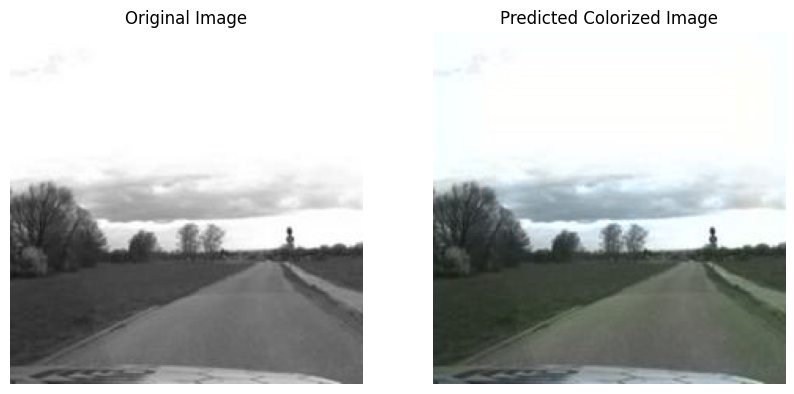

1/1 [==============================] - 0s 19ms/step
File saved successfully: /content/drive/MyDrive/Predicted2/2_0045.jpg


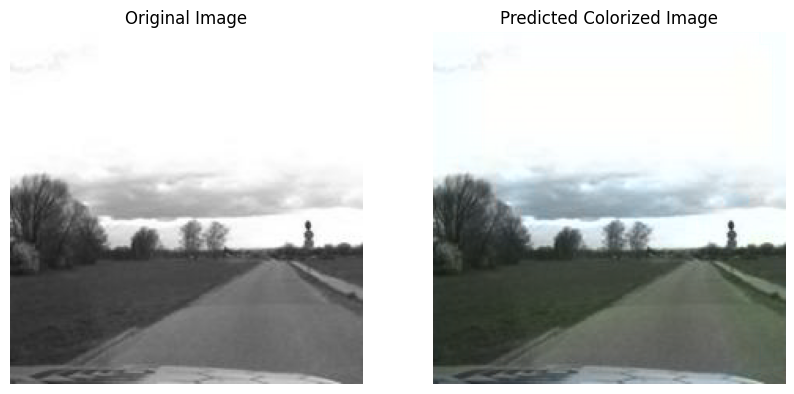

1/1 [==============================] - 0s 19ms/step
File saved successfully: /content/drive/MyDrive/Predicted2/2_0000.jpg


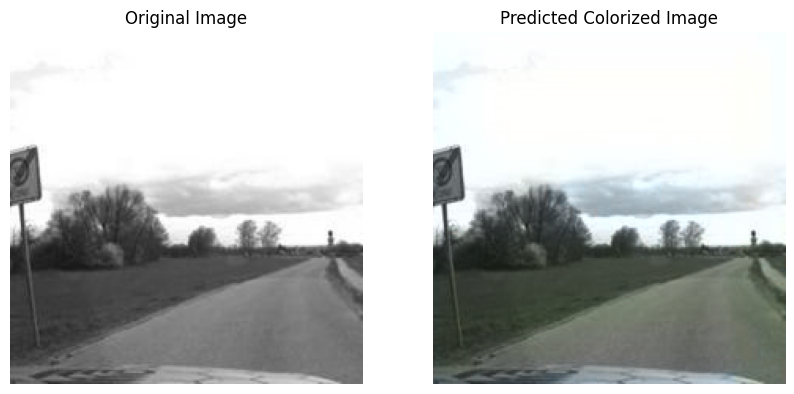

1/1 [==============================] - 0s 18ms/step
File saved successfully: /content/drive/MyDrive/Predicted2/2_0013.jpg


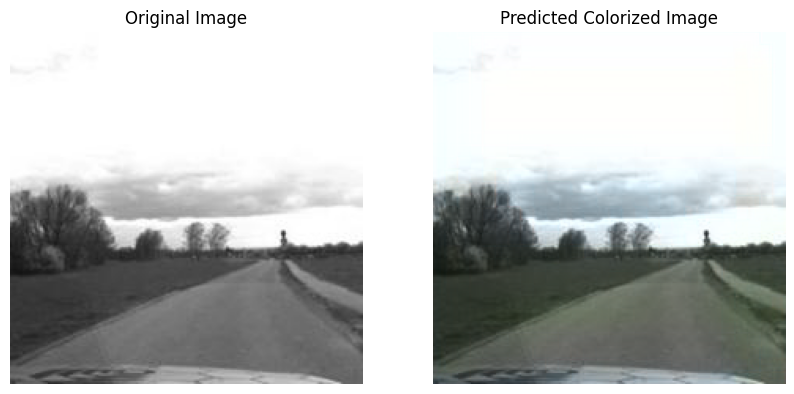

1/1 [==============================] - 0s 19ms/step
File saved successfully: /content/drive/MyDrive/Predicted2/2_0038.jpg


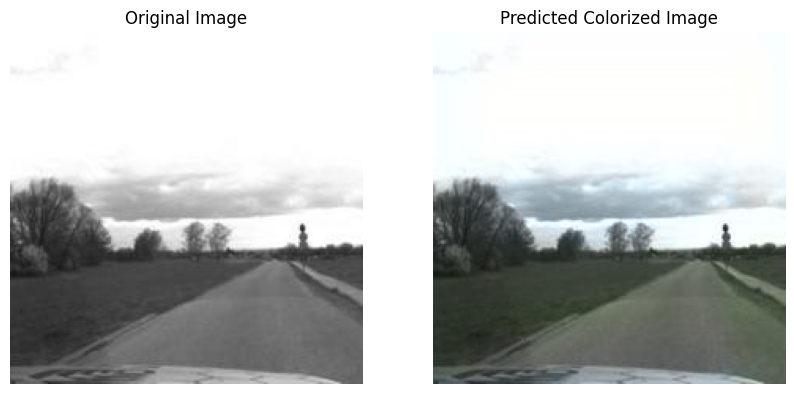

1/1 [==============================] - 0s 29ms/step
File saved successfully: /content/drive/MyDrive/Predicted2/2_0003.jpg


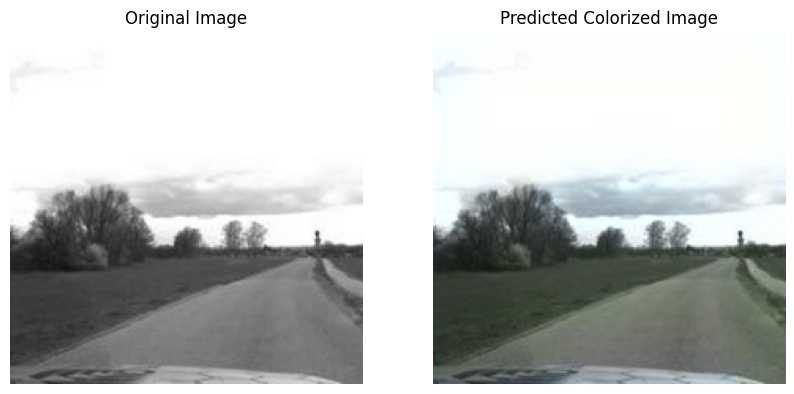

1/1 [==============================] - 0s 28ms/step
File saved successfully: /content/drive/MyDrive/Predicted2/2_0008.jpg


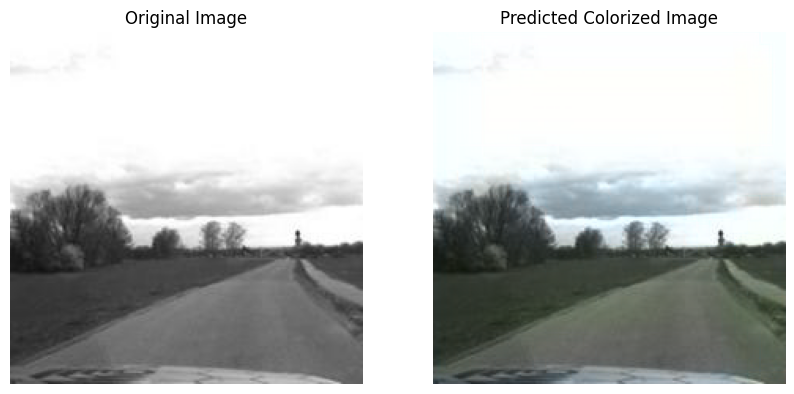

1/1 [==============================] - 0s 26ms/step
File saved successfully: /content/drive/MyDrive/Predicted2/2_0030.jpg


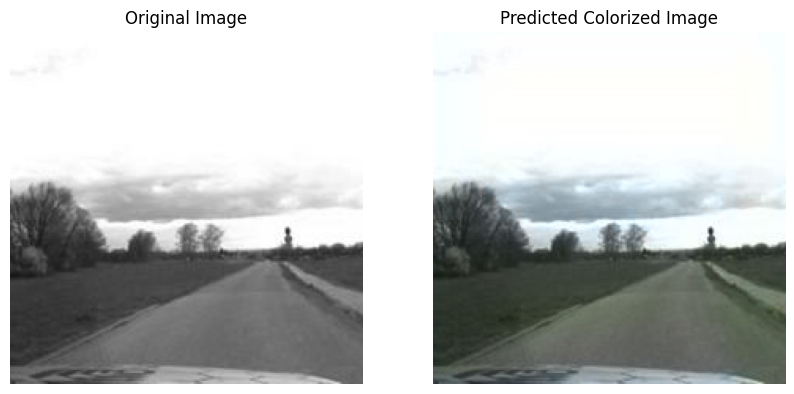

1/1 [==============================] - 0s 30ms/step
File saved successfully: /content/drive/MyDrive/Predicted2/2_0021.jpg


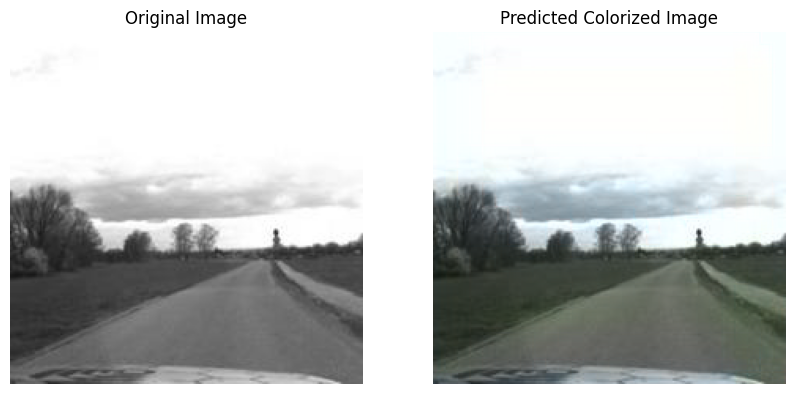

1/1 [==============================] - 0s 18ms/step
File saved successfully: /content/drive/MyDrive/Predicted2/2_0039.jpg


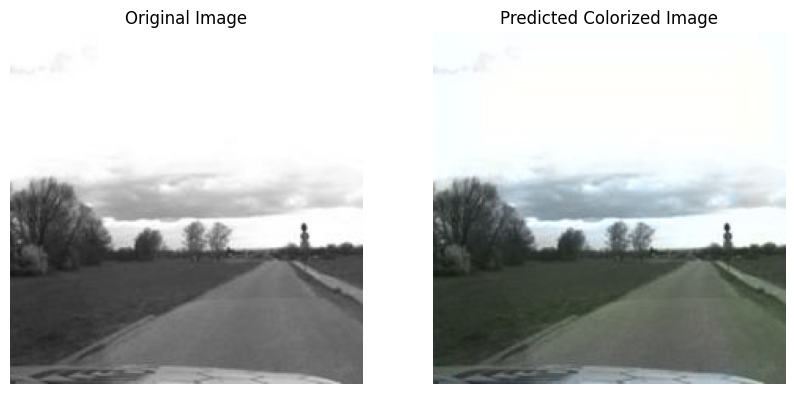

1/1 [==============================] - 0s 18ms/step
File saved successfully: /content/drive/MyDrive/Predicted2/2_0005.jpg


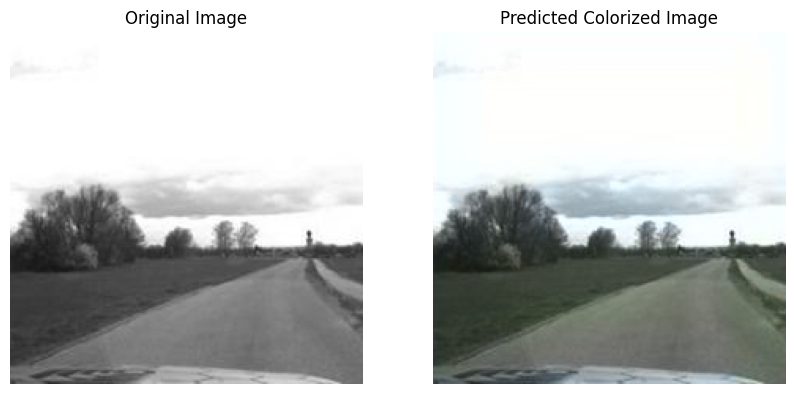

1/1 [==============================] - 0s 18ms/step
File saved successfully: /content/drive/MyDrive/Predicted2/2_0025.jpg


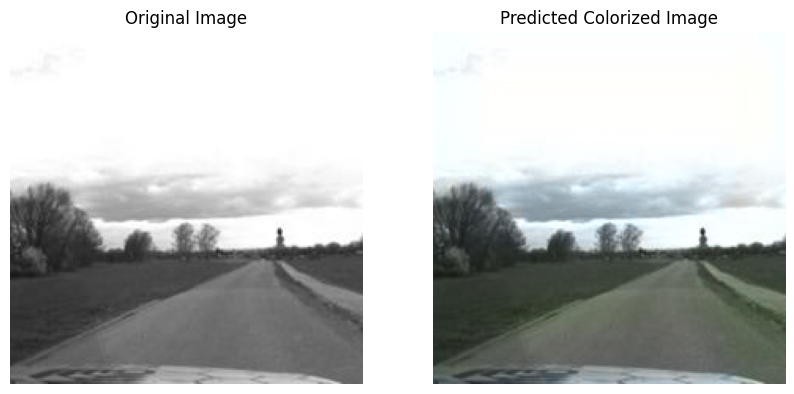

1/1 [==============================] - 0s 18ms/step
File saved successfully: /content/drive/MyDrive/Predicted2/2_0034.jpg


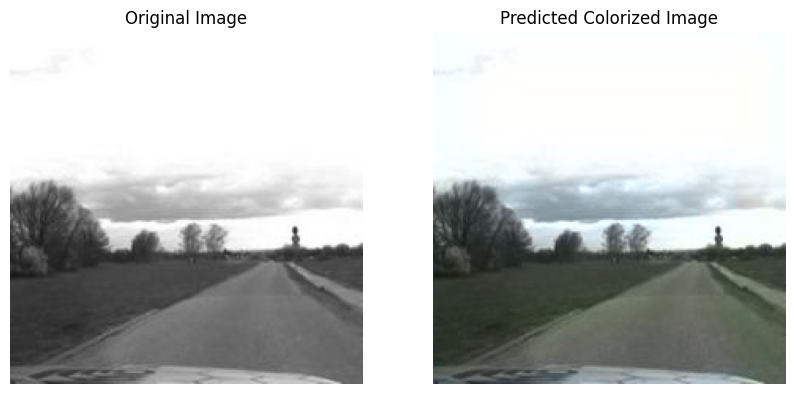

1/1 [==============================] - 0s 20ms/step
File saved successfully: /content/drive/MyDrive/Predicted2/2_0040.jpg


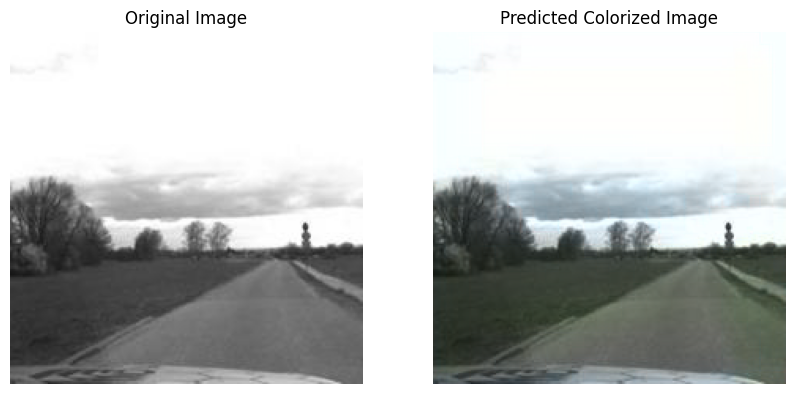

1/1 [==============================] - 0s 19ms/step
File saved successfully: /content/drive/MyDrive/Predicted2/2_0037.jpg


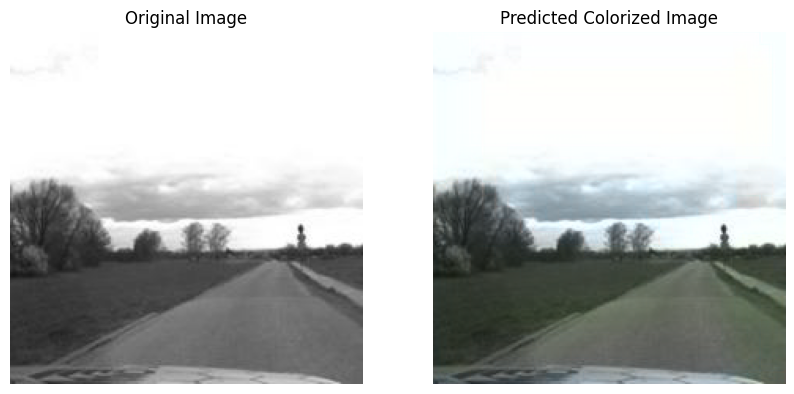

1/1 [==============================] - 0s 21ms/step
File saved successfully: /content/drive/MyDrive/Predicted2/2_0033.jpg


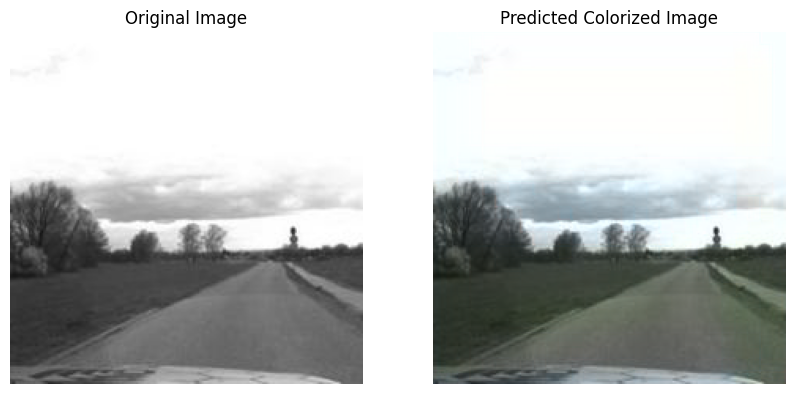

1/1 [==============================] - 0s 23ms/step
File saved successfully: /content/drive/MyDrive/Predicted2/2_0042.jpg


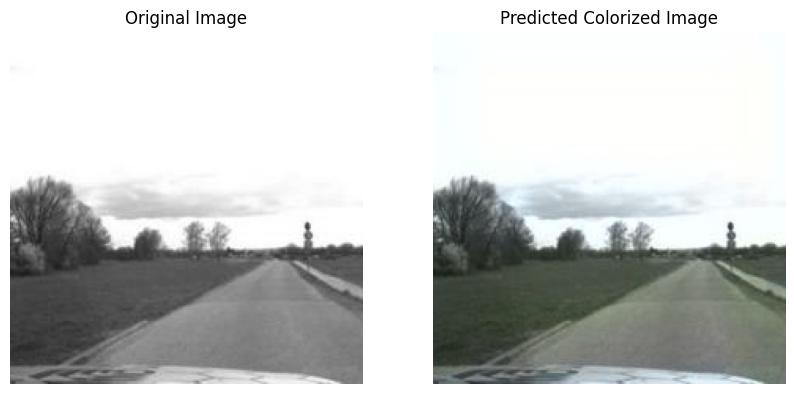

1/1 [==============================] - 0s 20ms/step
File saved successfully: /content/drive/MyDrive/Predicted2/2_0023.jpg


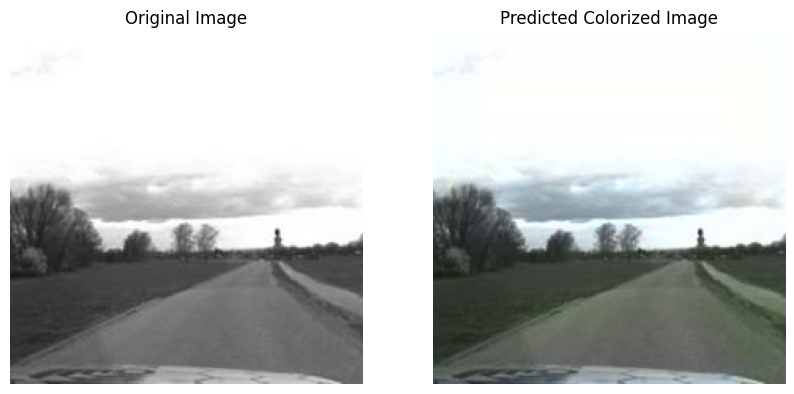

1/1 [==============================] - 0s 18ms/step
File saved successfully: /content/drive/MyDrive/Predicted2/2_0020.jpg


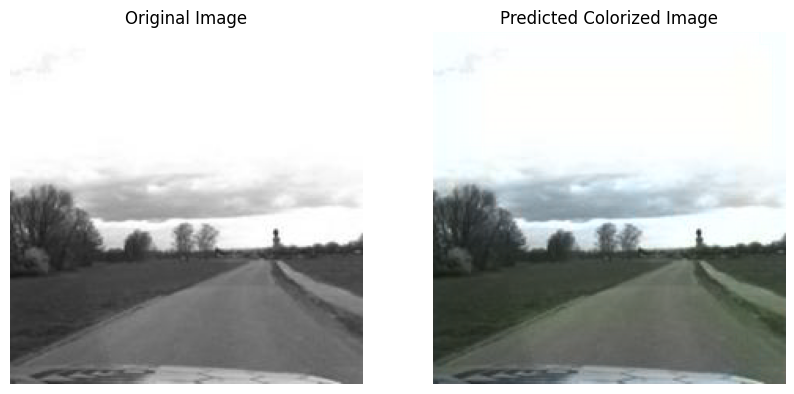

1/1 [==============================] - 0s 19ms/step
File saved successfully: /content/drive/MyDrive/Predicted2/2_0001.jpg


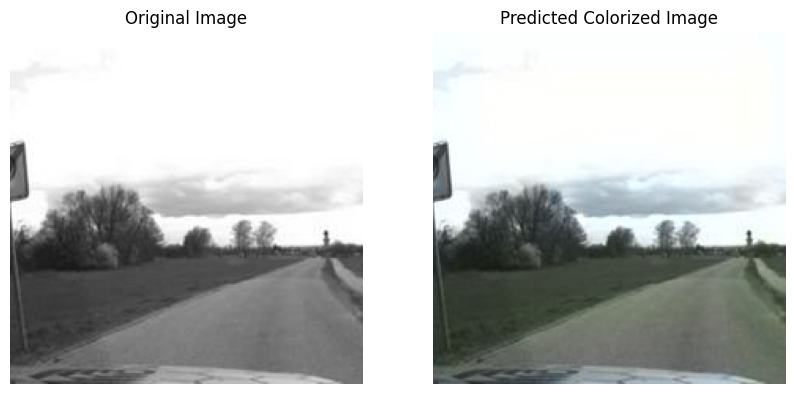

1/1 [==============================] - 0s 19ms/step
File saved successfully: /content/drive/MyDrive/Predicted2/2_0002.jpg


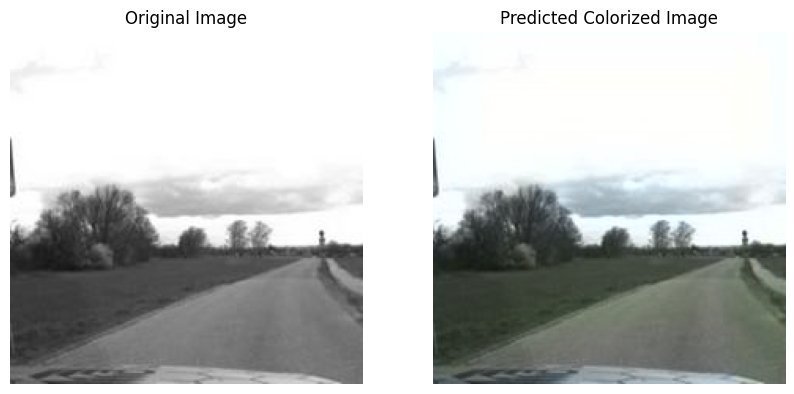

1/1 [==============================] - 0s 18ms/step
File saved successfully: /content/drive/MyDrive/Predicted2/2_0015.jpg


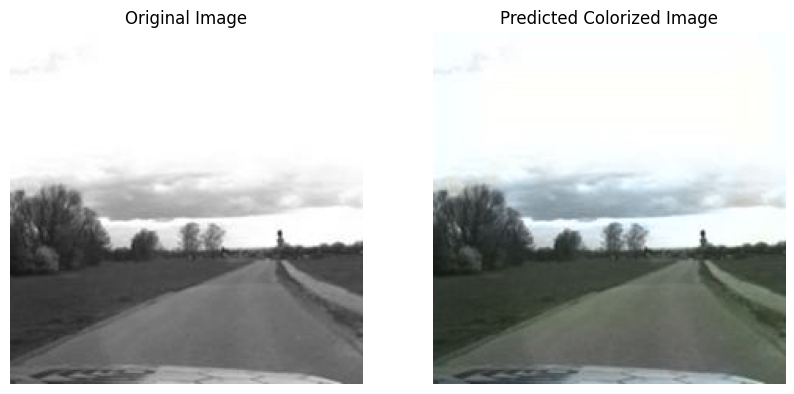

1/1 [==============================] - 0s 30ms/step
File saved successfully: /content/drive/MyDrive/Predicted2/2_0029.jpg


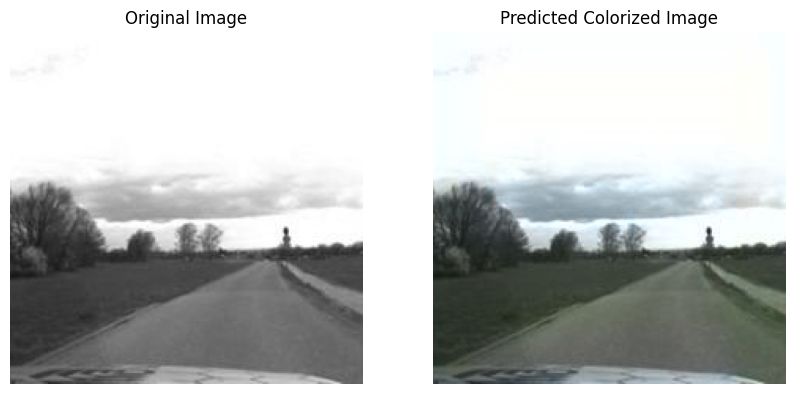

1/1 [==============================] - 0s 27ms/step
File saved successfully: /content/drive/MyDrive/Predicted2/2_0024.jpg


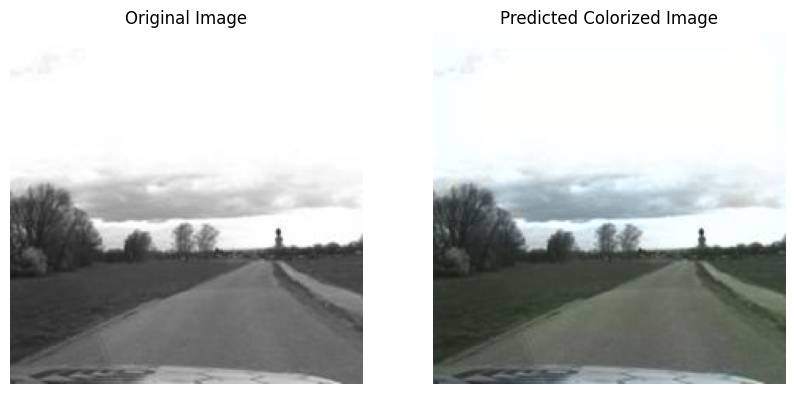

1/1 [==============================] - 0s 38ms/step
File saved successfully: /content/drive/MyDrive/Predicted2/2_0032.jpg


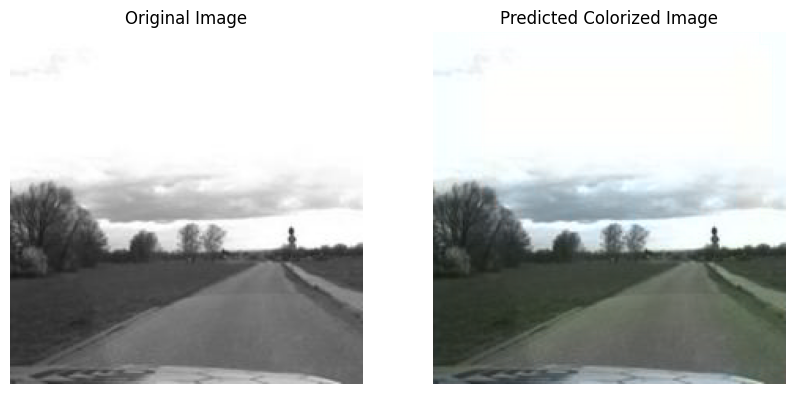

1/1 [==============================] - 0s 35ms/step
File saved successfully: /content/drive/MyDrive/Predicted2/2_0043.jpg


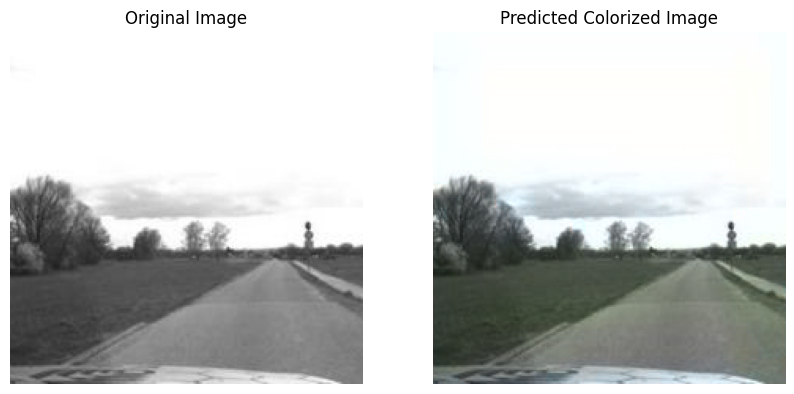

1/1 [==============================] - 0s 19ms/step
File saved successfully: /content/drive/MyDrive/Predicted2/2_0016.jpg


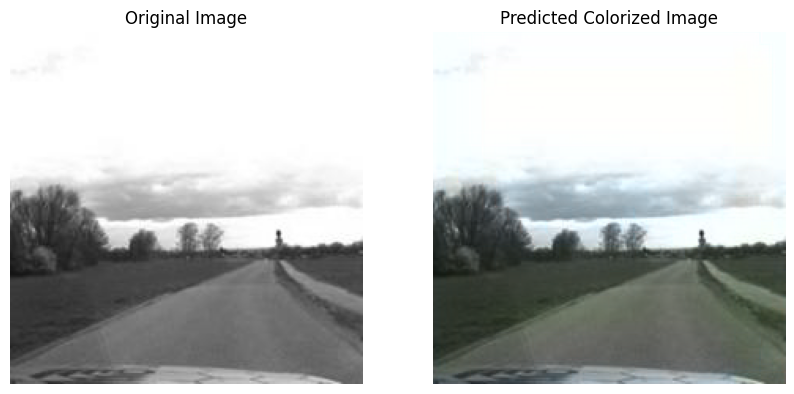

1/1 [==============================] - 0s 18ms/step
File saved successfully: /content/drive/MyDrive/Predicted2/2_0011.jpg


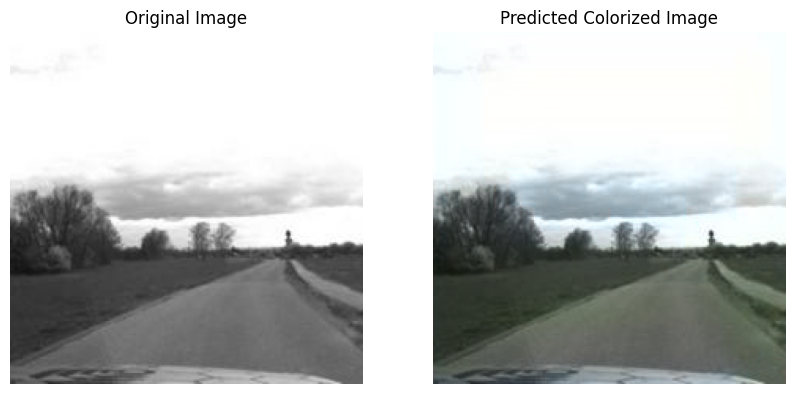

1/1 [==============================] - 0s 18ms/step
File saved successfully: /content/drive/MyDrive/Predicted2/2_0036.jpg


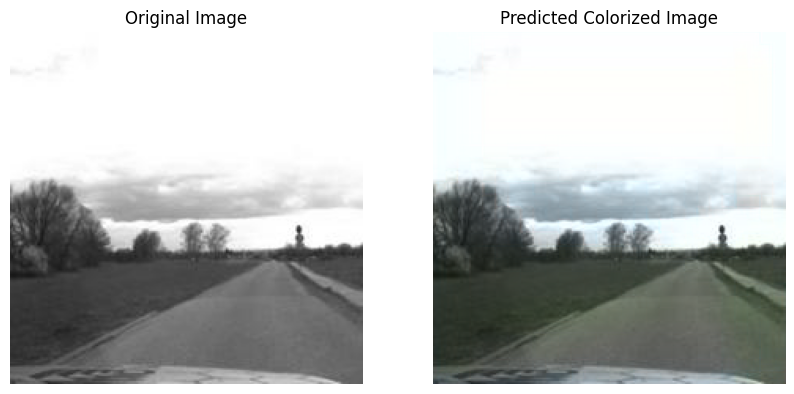

1/1 [==============================] - 0s 73ms/step
File saved successfully: /content/drive/MyDrive/Predicted2/2_0018.jpg


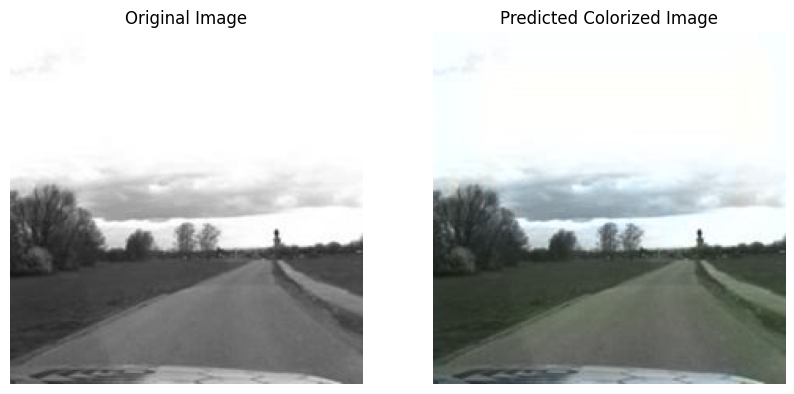

1/1 [==============================] - 0s 18ms/step
File saved successfully: /content/drive/MyDrive/Predicted2/2_0004.jpg


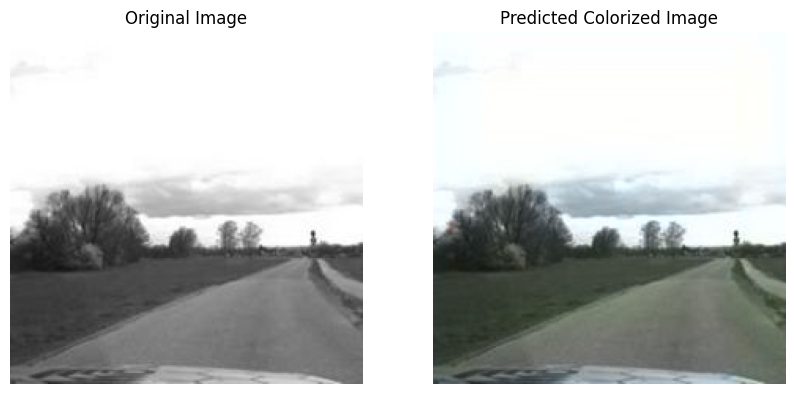

1/1 [==============================] - 0s 19ms/step
File saved successfully: /content/drive/MyDrive/Predicted2/2_0009.jpg


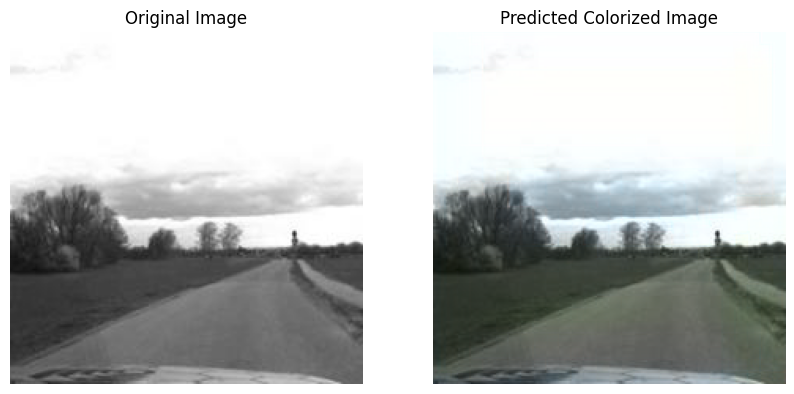

1/1 [==============================] - 0s 19ms/step
File saved successfully: /content/drive/MyDrive/Predicted2/2_0047.jpg


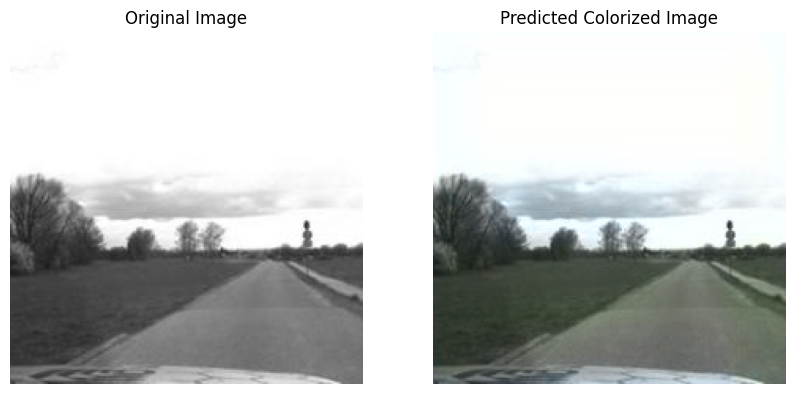

1/1 [==============================] - 0s 18ms/step
File saved successfully: /content/drive/MyDrive/Predicted2/2_0010.jpg


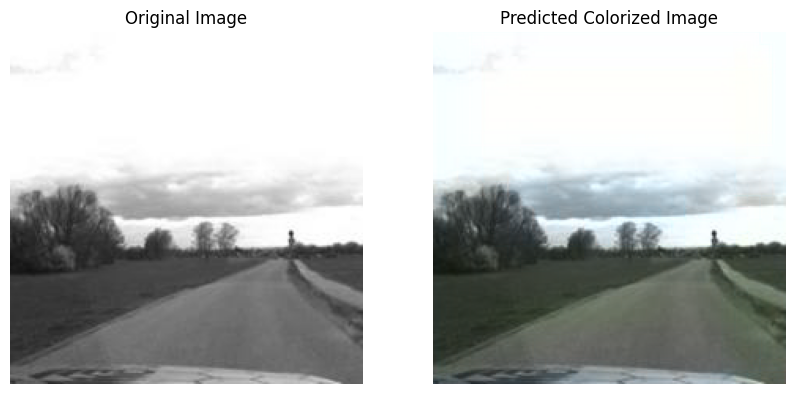

1/1 [==============================] - 0s 19ms/step
File saved successfully: /content/drive/MyDrive/Predicted2/2_0019.jpg


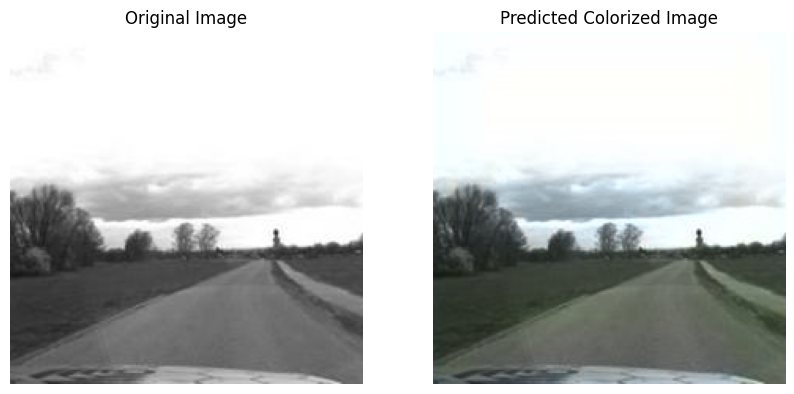

1/1 [==============================] - 0s 18ms/step
File saved successfully: /content/drive/MyDrive/Predicted2/2_0014.jpg


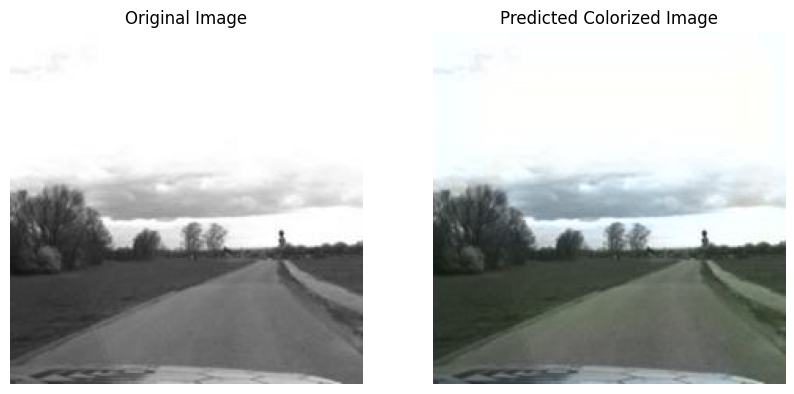

1/1 [==============================] - 0s 18ms/step
File saved successfully: /content/drive/MyDrive/Predicted2/2_0012.jpg


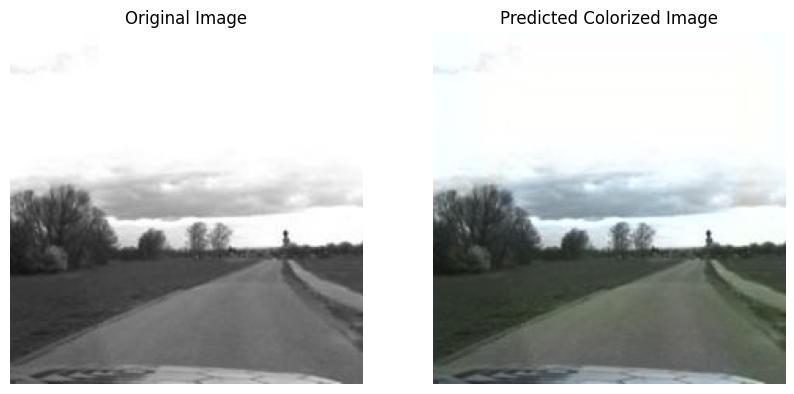

1/1 [==============================] - 0s 19ms/step
File saved successfully: /content/drive/MyDrive/Predicted2/2_0022.jpg


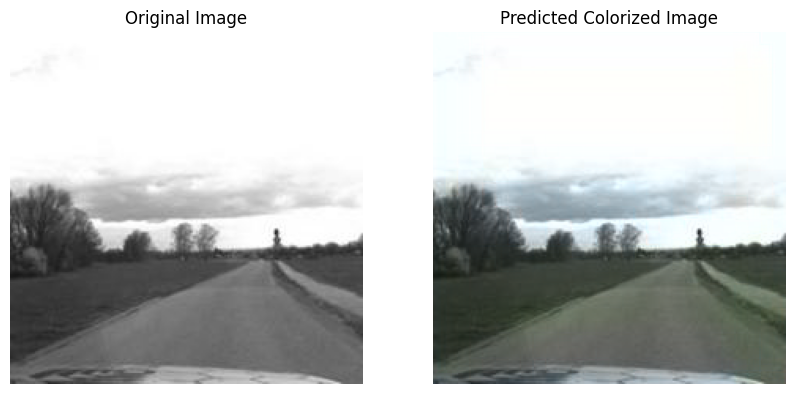

1/1 [==============================] - 0s 31ms/step
File saved successfully: /content/drive/MyDrive/Predicted2/2_0041.jpg


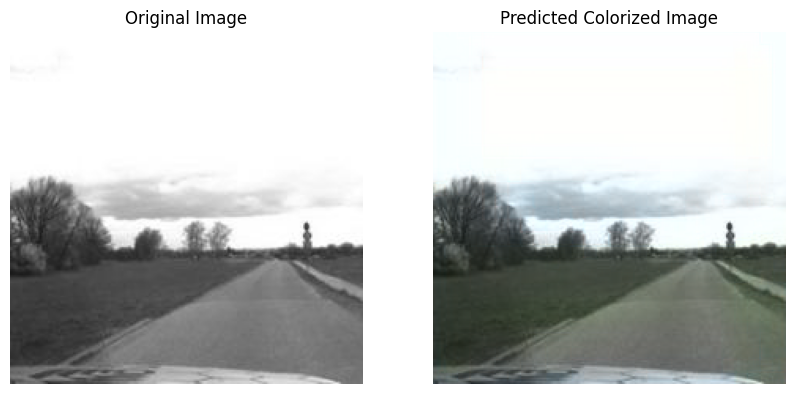

1/1 [==============================] - 0s 26ms/step
File saved successfully: /content/drive/MyDrive/Predicted2/2_0017.jpg


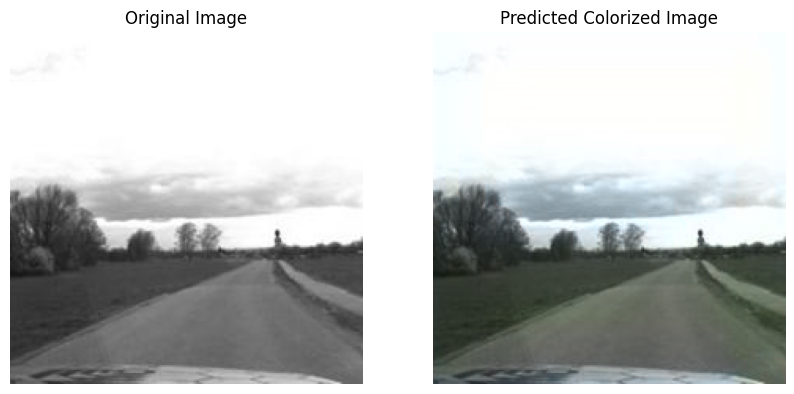

1/1 [==============================] - 0s 31ms/step
File saved successfully: /content/drive/MyDrive/Predicted2/2_0046.jpg


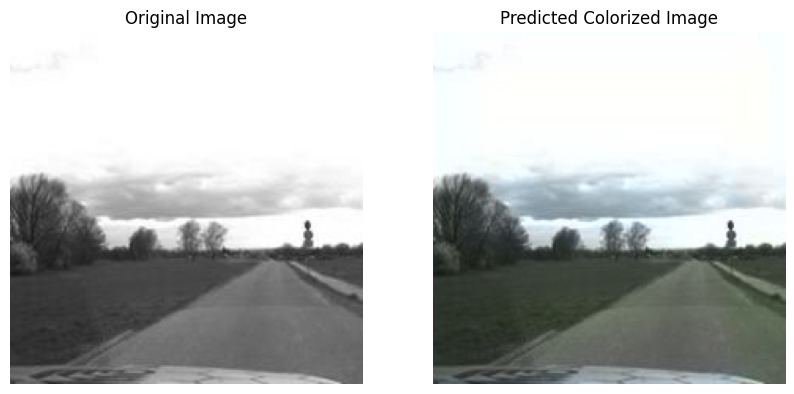

1/1 [==============================] - 0s 28ms/step
File saved successfully: /content/drive/MyDrive/Predicted2/2_0026.jpg


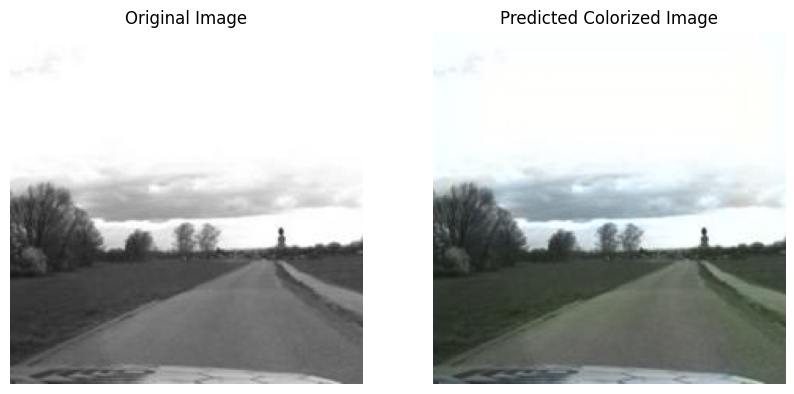

1/1 [==============================] - 0s 27ms/step
File saved successfully: /content/drive/MyDrive/Predicted2/2_0049.jpg


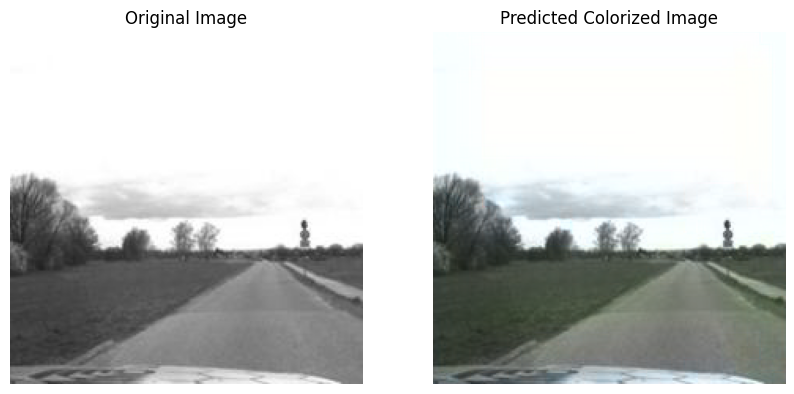

1/1 [==============================] - 0s 18ms/step
File saved successfully: /content/drive/MyDrive/Predicted2/2_0028.jpg


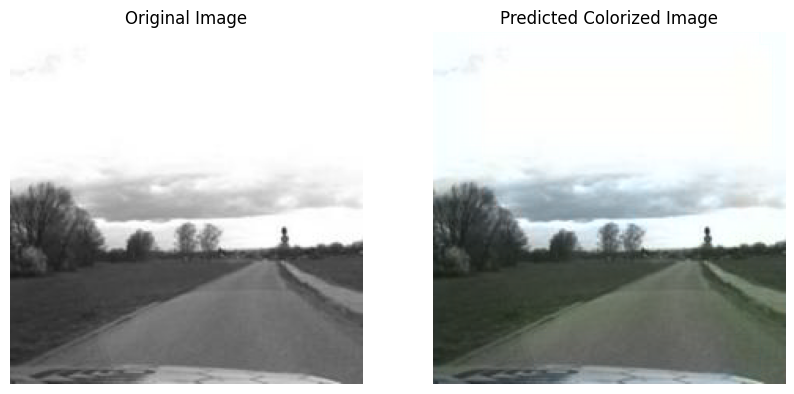

1/1 [==============================] - 0s 19ms/step
File saved successfully: /content/drive/MyDrive/Predicted2/2_0006.jpg


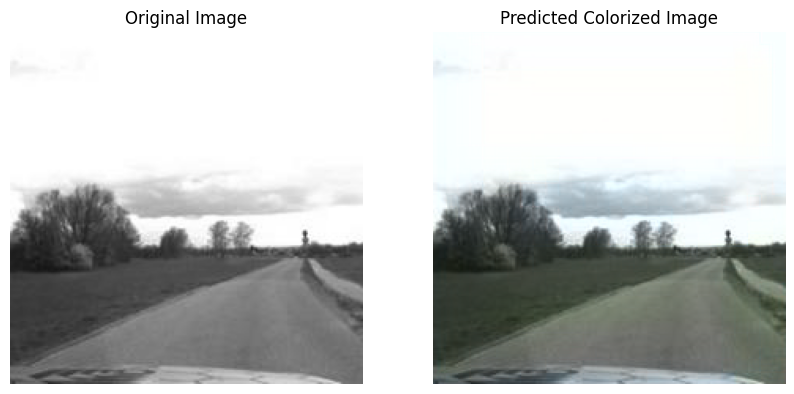

1/1 [==============================] - 0s 18ms/step
File saved successfully: /content/drive/MyDrive/Predicted2/2_0035.jpg


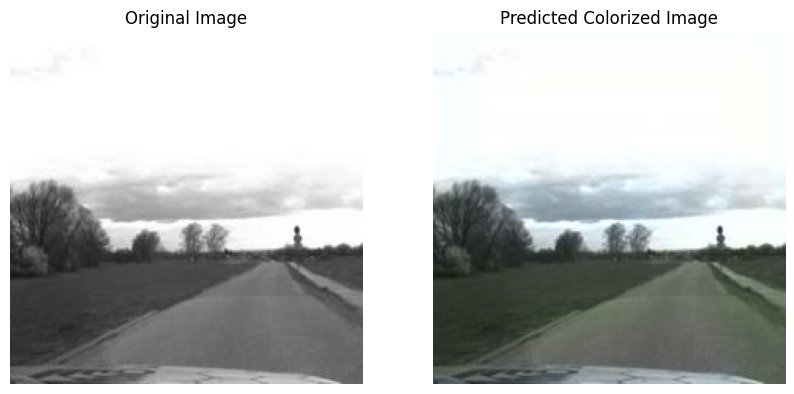

1/1 [==============================] - 0s 20ms/step
File saved successfully: /content/drive/MyDrive/Predicted2/2_0048.jpg


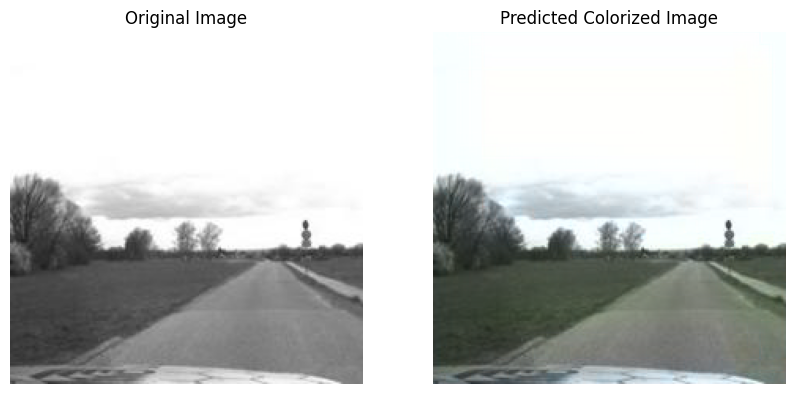

1/1 [==============================] - 0s 24ms/step
File saved successfully: /content/drive/MyDrive/Predicted2/2_0027.jpg


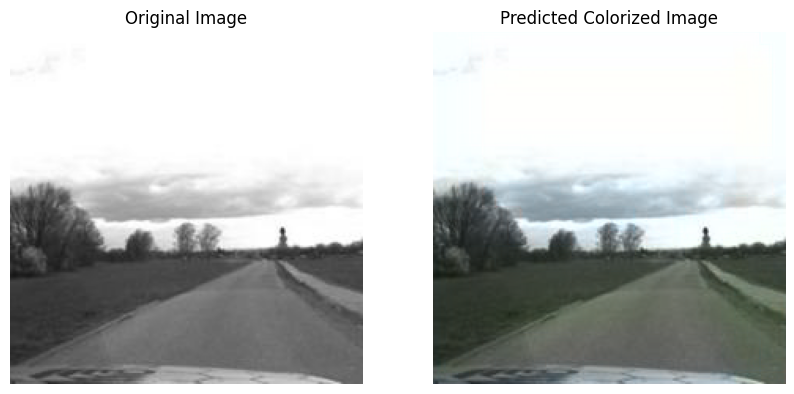

1/1 [==============================] - 0s 19ms/step
File saved successfully: /content/drive/MyDrive/Predicted2/2_0007.jpg


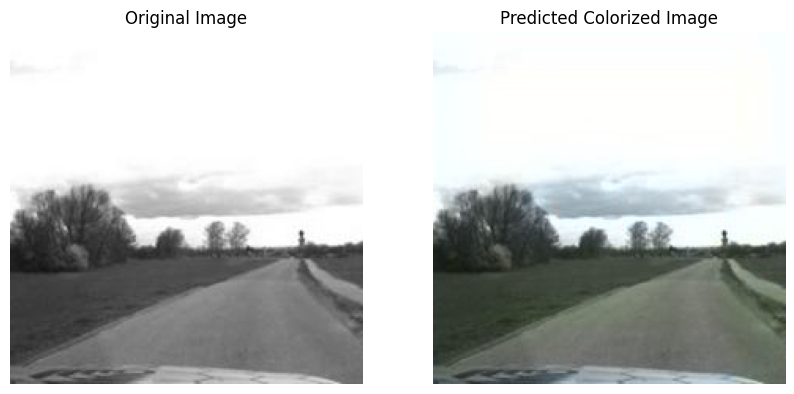

1/1 [==============================] - 0s 20ms/step
File saved successfully: /content/drive/MyDrive/Predicted2/2_0044.jpg


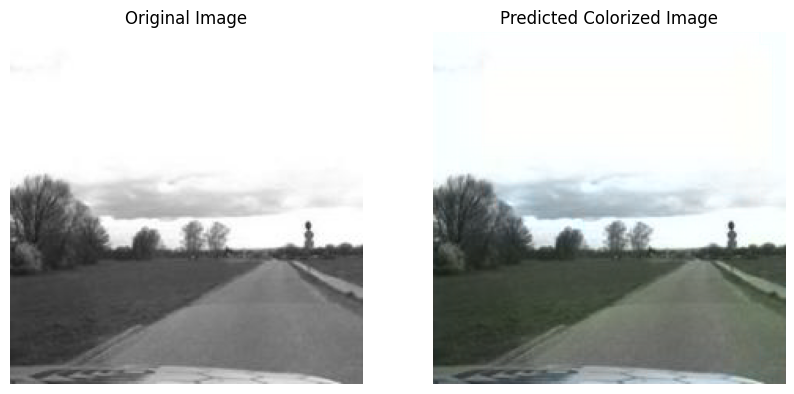

In [11]:
import cv2
import numpy as np
import os
from skimage.color import lab2rgb
import matplotlib.pyplot as plt

# Define test image path
test_data_path = "/content/drive/MyDrive/ML2/test_color/images"

# Path to save prediction results
save_path = "/content/drive/MyDrive/Predicted2/"

# Ensure the save path exists
os.makedirs(save_path, exist_ok=True)

# Load the test image file list
test_image_files = glob.glob(os.path.join(test_data_path, '*.jpg'))

# Loop through the test images and perform predictions
for file_name in test_image_files:
    # Read the test image
    img = cv2.imread(file_name)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    img_gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    img_gray = cv2.resize(img_gray, (224, 224))
    img_gray = img_gray[..., np.newaxis] / 255.0  # Normalize to [0, 1] range

    # Expand dimensions to match model input
    img_gray_input = np.expand_dims(img_gray, axis=0)

    # Use the model to predict
    predicted_ab = model.predict(img_gray_input)

    # Denormalize, restore the original scale of the AB channels
    predicted_ab = predicted_ab * 128.0

    # Combine the grayscale image with the predicted AB channels to form a LAB image
    lab_image = np.zeros((224, 224, 3))
    lab_image[:, :, 0] = img_gray[:, :, 0] * 100.0  # L channel
    lab_image[:, :, 1:] = predicted_ab

    # Convert to RGB image
    predicted_rgb = lab2rgb(lab_image)

    # Save the prediction result
    save_name = os.path.join(save_path, os.path.basename(file_name))
    cv2.imwrite(save_name, cv2.cvtColor((predicted_rgb * 255).astype(np.uint8), cv2.COLOR_RGB2BGR))

    # Verify if the file was saved successfully
    if os.path.exists(save_name):
        print(f"File saved successfully: {save_name}")
    else:
        print(f"Failed to save file: {save_name}")

    # Display the original image and the colorized prediction
    fig, axes = plt.subplots(1, 2, figsize=(10, 5))
    axes[0].imshow(img)
    axes[0].axis('off')
    axes[0].set_title('Original Image')
    axes[1].imshow(predicted_rgb)
    axes[1].axis('off')
    axes[1].set_title('Predicted Colorized Image')
    plt.show()


In [12]:
import os
import numpy as np
from PIL import Image

# Directory containing the images
image_dir = '/content/drive/MyDrive/Predicted2/'

# List to store all the images
images = []

# Iterate over all files in the directory
for filename in os.listdir(image_dir):
    if filename.endswith('.jpg'):
        # Read the image file
        img_path = os.path.join(image_dir, filename)
        try:
            with Image.open(img_path) as img:
                # Convert the image to a numpy array
                img_array = np.array(img)
                images.append(img_array)
        except Exception as e:
            print(f"Warning: Failed to read {img_path}. Error: {e}")

# Convert the list of images to a numpy array
images_array = np.array(images)

# Save the numpy array to a .npy file
np.save('images2.npy', images_array)

print("Images have been saved to images2.npy")



Images have been saved to images2.npy
